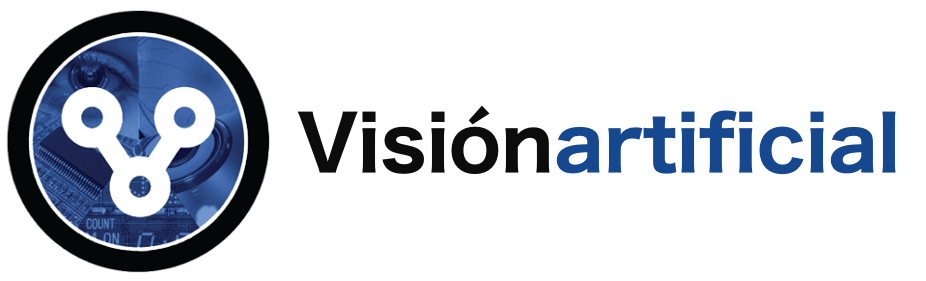

# OpenCV 

### para a materia de Visión Artificial do Grao de Robótica. EPSE de Lugo.

<hr style = "border: none; height: 4px; background-color: # D3D3D3" />

# 2.1 Calibración da cámara

Nos cadernos anteriores aprendemos como se proxectan puntos 3D aos píxeles da imaxe a través do *modelo de cámara*, utilizando **unha serie de parámetros** que non depende da posición dos puntos 3D, senón da propia cámara, como como a distancia focal $f$, as coordenadas do punto principal $(u_0,v_0)$ ou a posición da cámara con respecto ao sistema de referencia `MUNDO`. Estes parámetros están clasificados en dous conxuntos:
- **intrínseca (ou interna)**, e
- **extrínseca (ou externa)**.

A primeira categoría inclúe os parámetros que son **constantes para a mesma cámara** (a non ser que esteamos usando unha cámara que poida cambiar o seu zoom), mentres que a segunda só **depende da posición e orientación da cámara** no mundo. Na ecuación proxectiva completa, colócanse do seguinte xeito:

$$\lambda \begin{bmatrix} u \\ v\\ 1 \end{bmatrix} = \underbrace{\begin{bmatrix} f k_x & 0 & u_0 \\ 0 & f k_y & v_0 \\ 0 & 0 & 1 \end{bmatrix}}_{\text{intrínseco}} \underbrace{\begin{bmatrix} \bf{R} & \bf{t}\end{bmatrix}}_{\text{extrínseco}} \begin {bmatrix} X_W \\ Y_W\\ Z_W \\ 1 \end{bmatrix} \qquad \bf{\lambda \tilde{m}' = K \left[ R\ t \right] \tilde{M}_W}$$

O proceso de estimación dos parámetros intrínsecos e/ou extrínsecos dun sistema de visión chámase **calibración da cámara**. E iso é o que imos conseguir neste caderno!

Os **parámetros intrínsecos** tratan as características internas da cámara e inclúen:
- a súa distancia focal ($f$),
- os parámetros de sesgo ($k_x, k_y$),
- e o centro da imaxe, tamén coñecido como as coordenadas do punto principal ($u_0, v_0$).

Pola súa banda, os **parámetros extrínsecos** describen:
- a súa posición ($\mathbf{t}$)
- e a súa orientación ($\mathbf{R}$) no sistema de referencia `MUNDO`.

Ademais disto, hai un proceso do que aínda non falamos nos cadernos anteriores, pero que é de capital importancia á hora de tratar a xeración de imaxes: **distorsión da lente**. Tamén abordaremos este tema aquí.

Así que, en resumo, neste caderno imos aprender sobre:
- distorsión da lente (<a href="#211">sección 3.1.1</a>),
- calibración da cámara (<a href="#212">sección 2.1.2</a>),
- o método de calibración da transformación lineal directa (DLT) (<a href="#213">sección 2.1.3</a>),
- e o método de calibración de Zhang (<a href="#214">sección 2.1.4</a>).

## Contexto do problema: eliminación da distorsión da lente

Todas as cámaras teñen **distorsión radial** porque usan lentes reais. Na derivación matemática que presentamos no caderno anterior, supoñíamos que ningunha distorsión estaba a afectar ao procedemento de formación da imaxe e, polo tanto, a luz procedente dun determinado punto 3D viaxaba **seguindo unha liña recta**, pasando polo centro óptico e chegando finalmente a golpear. o plano sensor. Poderiamos dicir que a lente do noso modelo era **ideal**. Non obstante, na vida real, a luz distorsiona ao atravesar a lente e **cambia a súa dirección** antes de chegar ao sensor. Isto produce distorsión na imaxe capturada.

Por suposto, esta distorsión ás veces é desexada (principalmente por razóns estéticas) pero ás veces hai que compensala para obter unha imaxe adecuada. Un exemplo típico de alta distorsión radial está presente en **cámaras de acción** ou **cámaras ollo de peixe**.

<img src="./images/intro.jpg" width="400"/>

Como podes ver na imaxe, **as liñas rectas do mundo non están rectas na imaxe** debido á distorsión. E esa distorsión é máis grave nos píxeles máis afastados do centro da imaxe (de aí o termo **distorsión radial**).

Normalmente, o grao de distorsión vén dado por un par de variables, que tamén deben incluírse na categoría de parámetros intrínsecos. O proceso de calibración tamén ten como obxectivo determinar o valor deste tipo de parámetros para que poidamos eliminar a distorsión, aínda que sexa considerablemente grave.

Neste caderno calcularemos todos os parámetros intrínsecos da cámara do teu smartphone, incluídos os de distorsión, e utilizaremos para obter unha imaxe adecuada sen distorsións.

In [1]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
import matplotlib
import scipy.stats as stats
import glob
matplotlib.rcParams['figure.figsize'] = (14.0, 10.0)

images_path = './images/'

## 2.1.1 Distorsión da lente <span id=211></span>

Comecemos por indicar formalmente o modelo da distorsión.

Todas as cámaras distorsionan a imaxe ata certo punto, incluída a do noso teléfono móbil, pero, obviamente, as cámaras de ollo de peixe e as cámaras deportivas teñen unha **distorsión radial** maior porque as súas lentes son máis convexas. O uso de lentes máis convexas xustifícase nestes casos xa que teñen un **campo de visión máis amplo** e, polo tanto, poden captar unha parte maior da escena. Ademais, canto menor sexa a distancia focal da cámara, maior será a distorsión da lente que sufrirá.

En calquera caso, podemos definir a distorsión da cámara mediante esta fórmula (isto chámase *modelo polinómico de orde par*):$\\[10px]$

$$\begin{eqnarray}u_u & = & (1 + k_1 r^2 + k_2 r^4 + \ldots)(u_d-u_0) \qquad (u_d, v_d) \; \; \text{píxeles distorsionados}\\ v_u & = & (1 + k_1 r^2 + k_2 r^4 + \ldots)(v_d-v_0) \qquad (u_u, v_u) \; \; \text{píxeles non distorsionados}\end{eqnarray}\\[25px]$$ $$\text{con}\; r^2 = (u_d-u_0)^2+(v_d-v_0)^2$$

Teña en conta que o valor $r$ representa a **distancia do píxel ao centro da imaxe**. Neste modelo, o grao de distorsión vén dado polos parámetros de distorsión ($k_1,\ k_2, \ldots$), creando unha **expresión non lineal da distorsión**, que dependendo do signo de $k_1$ pode producir dúas formas distorsionadas, a saber, **alfiletero e barril**.$\\[10px]$

<img src="./images/radial.png" width="600"/>

Como podes ver, as liñas rectas curvan na imaxe debido á distorsión.

Existe outro tipo de distorsión chamada **tanxencial**, pero aparece principalmente debido a pequenos **defectos de fabricación que provocan que a lente e o sensor da cámara non sexan paralelos**. Como non está directamente relacionado coas propiedades físicas das lentes, non abordaremos este tipo neste caderno, só o mencionaremos:$\\[10px]$

<img src="./images/tangential.png" width="600"/>

Entón, a idea para eliminar a distorsión radial é **calcular os parámetros de distorsión mediante a calibración da cámara** e, a continuación, ter os píxeles distorsionados $(u_d,v_d)$ e a saída de calibración $(u_0,v_0)$ e $(k_1, k_2, \ldots)$, podemos atopar unha solución para os píxeles non distorsionados $(u_u,\ v_u)$!

Existe unha alternativa ao **modelo polinómico** presentado anteriormente chamado **modelo de división**, que se prefire porque require menos termos que o modelo polinómico en caso de distorsión severa. Tamén é un pouco máis doado traballar con:

$$u_u = u_0 + \frac{u_d - u_0}{1 + k_1 r^2 + k_2 r^4 + \ldots } \qquad v_u = v_0 + \frac{v_d - v_0}{1 + k_1 r^2 + k_2 r^4 + \ldots }$$

Finalmente, teña en conta que o **número de parámetros de distorsión debe ser superior a dous**, pero en xeral os parámetros relacionados con ordes máis altas da distancia radial son o suficientemente pequenos como para non inducir un forte impacto no proceso de eliminación da distorsión, a menos que estamos traballando en aplicacións que necesitan imaxes extremadamente precisas e sen distorsións.

### **<span style="color:green"><b><i>TAREFA 1: Experimentando co modelo divisivo</i></b></span>**

Imaxina que estamos a usar unha cámara deportiva cunha distorsión radial severa e que os parámetros intrínsecos están proporcionados na documentación da cámara. **Calcule as coordenadas sen distorsión** para os píxeles $(0,0)$, $(200, 200)$ e $(400, 400)$ **usando o modelo de división**, sabendo que os parámetros intrínsecos desta cámara son:

- $k_1 = -2.98786806·10^{-06}$, 
- $k_2 = 4.90775450·10^{-13}$, e
- $(u_0,v_0) = (303, 244)$.

In [2]:
# TAREFA 1
# datos do exercicio
k1, k2 = -2.98786806E-6, 4.90775450E-13
u0, v0 = (303,244)

distorted = np.array([[0, 200, 400],
                      [0, 200, 400]], dtype=np.float64)

# Definimos as matrices auxiliares
undistorted = np.zeros_like(distorted)

r = (distorted[0,:]-u0)**2 + ((distorted[1,:]-v0)**2)
dr = None

# achamos os pixeles sen distorsion
undistorted[0,:] = u0 + ((distorted[0,:]-u0)/(1+k1*r+k2*r**2))
undistorted[1,:] = v0 + ((distorted[1,:]-v0)/(1+k1*r+k2*r**2))


print(np.round(undistorted,1))

[[-239.   196.   410.8]
 [-192.5  198.3  417.4]]


**Comprobación de resultados**

<font color='blue'>**Saída esperada:**  </font>

     [[-239.   196.   410.8]
     [-192.5  198.3  417.4]]

## 2.1.2 Calibración da cámara <span id=212></span>

O proceso de calibración da cámara implica determinar unha determinada matriz $\mathbf{P}_{3\times4}$, que permite calcular a proxección $\bf{m}' = [u\ v]^\texttt{T}$ na imaxe (en píxeles) de calquera punto do mundo $\bf{M} = [X\ Y\ Z]^\texttt{T}$ no espazo:

$$\lambda\bf{\tilde{m}'}= \begin{bmatrix} \lambda u \\ \lambda v \\ \lambda \end{bmatrix} = \bf{P\tilde{M}} = \begin{bmatrix} p_{11} & p_{12} & p_{13} & p_{14} \\ p_{21} & p_{22} & p_{23} & p_{24} \\ p_{31} & p_{32} & p_{33} & p_{34} \end{bmatrix} \begin{bmatrix} X \\ Y \\ Z \\ 1 \end{bmatrix} \\[30pt]$$

$$u= \frac{p_{11}X + p_{12}Y + p_{13}Z + p_{14}}{p_{31}X + p_{32}Y + p_{33}Z + p_{34}} \qquad \qquad v= \frac{p_{21}X + p_{22}Y + p_{23}Z + p_{24}}{p_{31}X + p_{32}Y + p_{33}Z + p_{34}}$$

Se lembras do último caderno, esta matriz inclúe tanto a matriz de calibración $\mathbf{K}$ como a transformación homoxénea entre os sistemas de referencia `CAMERA` e `MUNDO`:

$$\bf{P = K[R\ t]}\\[10pt]$$

Pero queremos **calcular explícitamente** estes dous elementos por separado, é dicir:

- a **pose da cámara** $(\mathbf{R}, \mathbf{t})$, que inclúe **6 parámetros extrínsecos** ($t_x,\ t_y,\ t_z,\ \text{yaw}, \ \text{pitch},\ \text{roll}$):$\\[5pt]$

$$\bf{[R\ t]} = \begin{bmatrix} r_{11} & r_{12} & r_{13} & t_x\\ r_{21} & r_{22} & r_{23} & t_y\\ r_{31} & r_{32} & r_{33} & t_z \end{bmatrix}\\[10pt]$$

- os **parámetros intrínsecos da cámara** ($f,\ k_x,\ k_y,\ u_0,\ v_0$):$\\[5pt]$

$$K = \begin{bmatrix} fk_x & 0 & u_0\\ 0 & fk_y & v_0 \\ 0 & 0 & 1 \end{bmatrix}\\[10pt]$$

Ademais, queremos determinar **dous parámetros de distorsión radial** ($k_1, \ k_2$):$\\[5pt]$

$$\begin{eqnarray}u_d = (1 + k_1 r^2 + k_2 r^4)u_u\\ v_d = (1 + k_1 r^2 + k_2 r^4)v_u\end{eqnarray}$$

Non obstante, como $(\mathbf{R}, \mathbf{t})$ cambian a medida que se move a cámara, a calibración da cámara refírese xeralmente a calcular a matriz $\mathbf{K}$ e os parámetros de distorsión $(k_1,k_2) $.


### Procedemento xeral de calibración

**Paso 1. Obtén un conxunto de puntos 3D coñecidos** $\mathbf{M}_i$ (cantos máis, mellor):

Para obter un conxunto de puntos 3D $\mathbf{M}_i$, emprégase un **patrón de calibración**. Este patrón debe ser facilmente identificable na imaxe (normalmente úsase un taboleiro de xadrez) e os puntos 3D non deben estar nun só plano (necesítanse varios planos).$\\[8pt]$

<img src="./images/pattern.png" width="600"/>$\\[5pt]$

**Paso 2. Proporciona as súas proxeccións na imaxe** $\mathbf{m}_i$ (en píxeles):

Para iso, primeiro detectamos as esquinas dos cadrados do patrón (por exemplo, usando o detector Harris). Despois, establecemos os pares ($\mathbf{M}_i,\ \mathbf{m}_i$) en función da lista ordenada 2D de esquinas detectadas (coñécese previamente o número de columnas e filas do patróns de xadrez).$\ \[8pt]$

<img src="./images/2dPattern.png" width="300"/>$\\[5pt]$

**Paso 3. Aplica o modelo de cámara para estimar os parámetros** $\mathbf{K},\ \mathbf{R},\ \mathbf{t}$ que mellor resolven as coincidencias entre os pares correspondentes ($\mathbf {M}_i,\ \mathbf{m}_i$)

Este é o paso máis complexo e existen moitas alternativas, algunhas delas moi populares. Neste caderno imos abordar dous deles:

- Transformación lineal directa (DLT)
- O método de Zang

## 2.1.3 Método de calibración DLT <span id=213></span>

Calcula $\bf{K,\ R,}$ e $\bf{t}$ directamente a partir de $\bf{P}$ e **non ten en conta a distorsión** (suponse que é despreciable).

Para iso, primeiro, a matriz $\bf{P}$ calcúlase a partir dun conxunto de $N \ge 6$ puntos, xa que $\bf{P}$ ten 11 graos de liberdade. Isto realízase de xeito similar ao cálculo da homografía xa visto.

$$\bf{P} = \begin{bmatrix} p_{11} & p_{12} & p_{13} & p_{14} \\ p_{21} & p_{22} & p_{23} & p_{24} \\ p_{31} & p_{32} & p_{33} & p_{34} \end{bmatrix}$$

Entón, dado que $\\[5pt]$

$$\bf{P = K\ [R\; t] = [KR\; Kt] = [B\; b]}\\[5pt]$$

usamos a súa submatriz esquerda $3 \times 3$ $\bf{B}$ para calcular a matriz de rotación e a matriz de calibración, e o vector columna da dereita $\bf{b}$ para calcular a translación do seguinte xeito:

 1. Realiza a **factorización RQ** para descompoñer $\bf{B}$ no produto de dúas matrices: $\bf{B = RQ}$, onde $\bf{R}$ é unha matriz triangular superior ( correspondente á parte de calibración, é dicir, $\bf{K}$) e $\bf{Q}$ é unha matriz ortogonal (correspondente á matriz de rotación). $\\[10pt]$
    
$$\bf{B}  = \begin{bmatrix} p_{11} & p_{12} & p_{13} \\ p_{21} & p_{22} & p_{23} \\ p_{31} & p_{32} & p_{33} \end{bmatrix} = KR = \underbrace{\begin{bmatrix} k_{11} & k_{12} & k_{13} \\ 0 & k_{22} & k_{23} \\ 0 & 0 & k_{33} \end{bmatrix}}_{\text{intrinsecos}}\underbrace{\begin{bmatrix} r_{11} & r_{12} & r_{13} \\ r_{21} & r_{22} & r_{23} \\ r_{31} & r_{32} & r_{33} \end{bmatrix}}_{\text{extrinsecos (rotacion)}}$$
    
A solución deste sistema non é única (existen diferentes combinacións de signos), pero podemos escoller a correcta forzando que os elementos diagonais de $\bf{R} (=\bf{K})$ sexan todos positivos. A partir da matriz de rotación, os parámetros $yaw$, $pitch$ e $roll$ pódense determinar facilmente.

*Nota: a factorización RQ é análoga ao procedemento [QR-descomposition](https://en.wikipedia.org/wiki/QR_decomposition) moi coñecido pero cambiando a orde das matrices.*

2. Dados $\bf{K}$ e $\bf{b}$, podemos obter a parte de tradución de $\bf{b = Kt}$ $\rightarrow$ $\bf{t = K^{-1 }b}$
 
 $$\bf{b} = \underbrace{\begin{bmatrix} p_{14} \\ p_{24} \\ p_{34} \end{bmatrix}}_{\text{coñecido}} = \bf{Kt} =  \underbrace{\begin{bmatrix} k_{11} & k_{12} & k_{13} \\ 0 & k_{22} & k_{23} \\ 0 & 0 & k_{33} \end{bmatrix}}_{\text{coñecido}} \underbrace{\begin{bmatrix} t_x \\ t_y \\ t_z \end{bmatrix}}_{\text{descoñecido}}$$


 ## 2.1.4 O método de Zhang <span id=214></span>
 
O método DLT non se usa con moita frecuencia pero so o de Zhang, principalmente porque é máis agradable de usar.
 
No método de Zhang, o **patrón de calibración é só unha imaxe simple dun taboleiro** (por exemplo, impreso nun papel), polo que non é necesario construír unha estrutura con varios planos, xa que está **baseada en homografías 2D* * entre o modelo e as súas imaxes. Para capturar as imaxes, pódese mover a cámara ou o patrón. Aquí podes ver algúns exemplos do tipo de imaxes utilizadas para a calibración.$\\[5pt]$
 
<img src="./images/zhangs.png" width="400"/>$\\[5pt]$
 
**Procedemento:**

- **Imprime o modelo do patrón** e fíxao a unha superficie plana ríxida (por exemplo, un cartón ou unha táboa de madeira)$\\[4pt]$

- **Toma varias imaxes do patrón** en diferentes poses, xa sexa movendo a cámara ou o patrón para que este se vexa en diferentes posicións na imaxe e con diferentes ángulos.$\\[4pt]$

- **Detecta as esquinas** dos cadrados nas imaxes.$\\[4pt]$

- **Estime** os 5 parámetros intrínsecos e 6 extrínsecos mediante unha **solución de forma pechada**, como mostraremos a continuación. Esta solución non é moi precisa e non inclúe a distorsión radial.$\\[4pt]$

- **Refina** a solución anterior e atopa un valor máis preciso para $\bf{K,\ R,\ t}$ e $k_1, k_2$ **resolvendo iterativamente un sistema non lineal** (aquí inclúe a distorsión)$\\[4pt]$
 
### Estimación aproximada do parámetro

Primeiro usamos unha solución de forma pechada para estimar estes parámetros lineais (non a distorsión!):
- A matriz de calibración $\bf{K}$, onde convertemos $(fk_x,fk_y)$ en só 2 incógnitas $(s_x,s_y)$, polo que temos unha cantidade total de **4 incógnitas**: $(u_0,v_0,s_x,s_y)$
- A rotación e translación $\bf{R}_i$ e $\bf{t}_i$, sendo $i=\{1,\ldots,N\}$, sendo $N$ o número de imaxes tomadas e **Levandonos a $6N$ incognitas**.

En liñas xerais, o procedemento é o seguinte (os detalles pódense atopar no [paper orixinal](https://www.microsoft.com/en-us/research/wp-content/uploads/2016/02/tr98-71.pdf)):

1. Estima a homografía $\bf{H_i}$ para cada par imaxe/plano-patrón.$\\[4pt]$

2. Calcula a matriz de calibración $\bf{K}$ a partir do conxunto de $\bf{H_i}$.$\\[4pt]$

3. Calcula $\bf{R}_i$, $\bf{t}_i$ para cada patrón de plano da matriz de calibración e cada homografía $\bf{H_i}$.$\\[4pt]$

Non obstante, o resultado deste método **non é o suficientemente preciso** xa que:

- Os $\bf{R}_i$ calculados non son matrices ortogonais.$\\[4pt]$
- Non se considerou ningunha distorsión radial.$\\[4pt]$

### Paso de refinado

Para obter unha mellor solución, podemos **iterar o enfoque de forma pechada**, incorporando unha solución para as ecuacións de distorsión da lente e comprobar se hai erros na proxección do punto, **ou resolver todos os parámetros** $ (\bf{R}_i$, $\bf{t}_i)$ e a distorsión ($k_1,k_2$) seguindo un enfoque iterativo baseado en Levemberg-Marquadt e utilizando como solución inicial a que deu o procedemento de forma pechada. O obxectivo tamén é minimizar o erro de reproxección:$\\[4pt]$

$$erro = \sum_{i=1}^n\sum_{j=1}^m\; ||{\bf{m}_{ij} - \tilde{\bf{m}}\ (\bf{K},\ \bf{R}_i, \bf{t}_i, k_1, k_2, \ bf{M}_j)}||^2$$

### Cantas imaxes do patrón necesitamos?

Neste método, se temos $N$ imaxes con $M$ esquinas cada unha, temos $2NM$ ecuacións e, como dixemos antes, necesitamos estimar 4 parámetros intrínsecos ($fk_x,\ fk_y,\ u_0,\ v_0$) para a matriz de calibración e un total de $6N$ parámetros extrínsecos ($\bf{R}_i,\ \bf{t}_i$), con $i=\{1,\ldots,N\}$ .

$$2NM \ge 4 + 6N \Longrightarrow N \ge \frac{2}{M-3}\; \text{e}\; M\gt 3$$

Entón, necesitamos polo menos:

- $N=2$ imaxes con $M=4$ puntos cada unha, pero esta solución ten pouca precisión debido ao ruído nos puntos. Coma sempre, canta máis imaxes empregadas mellor! Ademais, é importante que o patrón sexa capturado nas máis variadas posicións da imaxe, para evitar un sobreajuste dos parámetros nunha zona da imaxe.

*Ten en conta que esta situación tamén sería válida numericamente*:
- *$N = 1$ imaxes con $M = 5$ puntos $\rightarrow 2NM = 10$ ecuacións e $4+6N = 10$ incógnitas, pero **esta non é realmente unha solución, xa que todos os puntos serían coplanares* *, e iso sería un problema **mal condicionado**!*

## 2.1.5 Programación

Agora que sabes como funciona a calibración da cámara, imos usar **OpenCV para calibrar a cámara do noso smartphone** (ou as imaxes de exemplo que se ofrecen en `/images/calibration` se non tes unha). Cando calibramos unha cámara, tamén se determinan os parámetros de distorsión da cámara. Con eles, é posible eliminar a distorsión radial das imaxes da cámara (normalmente para as cámaras de teléfonos intelixentes é imperceptible, a non ser que para as que teñan un obxectivo gran angular, pero tamén se pode usar unha cámara deportiva se tes a sorte de ter unha).

Afortunadamente para nós **OpenCV xa define un método de calibración** [cv2.calibrateCamera()](https://docs.opencv.org/4.2.0/d9/d0c/group__calib3d.html#ga3207604e4b1a1758aa66acb6ed5aa65d), que implementa **variante do método de Zhang**. Pero primeiro, como se explica anteriormente, necesitamos un **patrón de calibración** coa imaxe do taboleiro. Podes imprimir unha dende [aqui](https://www.google.com/search?q=camera+calibration+pattern&tbm=isch&ved=2ahUKEwi56NbFsqTpAhWO1uAKHXlVAIAQ2-cCegQIABAA&oq=camera+calibration+pattern&gs_lcp=CgNpbWcQAzICCAAyBggAEAgQHjIGCAAQCBAeMgQIABAYOgQIIxAnOgQIABBDUMIyWMdTYP5UaAJwAHgAgAFbiAGuEJIBAjI4mAEAoAEBqgELZ3dzLXdpei1pbWc&sclient=img&ei=nGG1XrmqPI6tgwf5qoGACA&bih=951&biw=1853&client=ubuntu&hs=qxl&hl=en) para calibrar a túa cámara na casa.

Comezamos!

1. Move o patrón de calibración ou a cámara para capturar un conxunto de **varias imaxes do patrón** desde diferentes perspectivas.

2. Despois, teremos que **detectar as esquinas** (por exemplo, usando o detector de esquinas de Harris) de todas as imaxes. Afortunadamente, OpenCV define un método optimizado [cv2.findChessboardCorners()](https://docs.opencv.org/4.2.0/d9/d0c/group__calib3d.html#ga93efa9b0aa890de240ca32b11253dd4a), que detecta automaticamente as esquinas do patrón.

3. Estas esquinas **terán que coincidir coas coordenadas de píxeles sen perspectiva** para calcular as homografías (lembras cando emparexaches os puntos do campo de fútbol coas esquinas dun rectángulo?). Como exemplo, se detectamos a segunda esquina da terceira columna no patrón, teremos que facer coincidir o píxel detectado por `cv2.findChessboardCorners()` cun múltiplo de $(1,2)$.

4. Proporciona o **mapeamento das esquinas** das imaxes co patrón como entrada do método `cv2.calibrateCamera()`, que **devolve directamente os parámetros intrínsecos e os parámetros de distorsión radial e tanxencial.**.

5. **Unha vez que teñamos os parámetros intrínsecos** chamaremos ao método [cv2.undistort()](https://docs.opencv.org/4.2.0/d9/d0c/group__calib3d.html#ga69f2545a8b62a6b0fc2ee060dc3,559dc3) que implementa un **algoritmo iterativo** para eliminar a distorsión da imaxe calculando as coordenadas do punto orixinal normalizado a partir das coordenadas do punto normalizado distorsionado (*normalizado* significa que as coordenadas non dependen da matriz da cámara).

**Ben, imos darlle unha volta, pero paso a paso!**


### **<span style="color:green"><b><i>TAREFA 2: Definición da imaxe do patrón ideal</i></b></span>**

En primeiro lugar, imos **definir a matriz que contén os puntos do obxecto**, que é unha matriz con forma $(\text{#corners},3)$. Esta matriz contén as coordenadas ideais das esquinas nunha imaxe non en perspectiva do patrón (necesarias para a obtención das homografías). **Esta será a nosa imaxe ideal do patrón**.

Como as esquinas se detectarán usando `cv2.findChessboardCorners()`, a orde das esquinas está fixada e debería ser así:

$$[(0,0,0),\ (1,0,0),\ (2,0,0),\ \ldots ,\ (\text{n_rows}, \text{n_cols},0)] $$

Ten en conta que as esquinas que detectaremos son as **esquinas interiores do patrón**. [`np.mgrid()`](https://numpy.org/doc/stable/reference/generated/numpy.mgrid.html) pode axudarche aquí.

Entón, a nosa primeira tarefa é construír unha matriz como esta (a terceira columna é obrigatoria): 

<font color='blue'>**Saída esperada (para un patrón de esquinas de $12\times13$, adapta estes números ao teu propio patrón):**  </font>

    [[ 0.  0.  0.]
     [ 1.  0.  0.]
     [ 2.  0.  0.]
     [ 3.  0.  0.]
           .
           .
           .
     [ 8. 12.  0.]
     [ 9. 12.  0.]
     [10. 12.  0.]
     [11. 12.  0.]]

In [3]:
# TAREFA 2

# Esquinas do patron
corners_r = 12
corners_c = 13

# Elaboración dunha matriz de puntos obxecto
objp = np.zeros((corners_r*corners_c,3), dtype= np.float32)
objp[:,:2] = np.mgrid[0:corners_r,0:corners_c].T.reshape(-1,2)

# Imprimir a matriz de puntos do obxecto
print(objp)

[[ 0.  0.  0.]
 [ 1.  0.  0.]
 [ 2.  0.  0.]
 [ 3.  0.  0.]
 [ 4.  0.  0.]
 [ 5.  0.  0.]
 [ 6.  0.  0.]
 [ 7.  0.  0.]
 [ 8.  0.  0.]
 [ 9.  0.  0.]
 [10.  0.  0.]
 [11.  0.  0.]
 [ 0.  1.  0.]
 [ 1.  1.  0.]
 [ 2.  1.  0.]
 [ 3.  1.  0.]
 [ 4.  1.  0.]
 [ 5.  1.  0.]
 [ 6.  1.  0.]
 [ 7.  1.  0.]
 [ 8.  1.  0.]
 [ 9.  1.  0.]
 [10.  1.  0.]
 [11.  1.  0.]
 [ 0.  2.  0.]
 [ 1.  2.  0.]
 [ 2.  2.  0.]
 [ 3.  2.  0.]
 [ 4.  2.  0.]
 [ 5.  2.  0.]
 [ 6.  2.  0.]
 [ 7.  2.  0.]
 [ 8.  2.  0.]
 [ 9.  2.  0.]
 [10.  2.  0.]
 [11.  2.  0.]
 [ 0.  3.  0.]
 [ 1.  3.  0.]
 [ 2.  3.  0.]
 [ 3.  3.  0.]
 [ 4.  3.  0.]
 [ 5.  3.  0.]
 [ 6.  3.  0.]
 [ 7.  3.  0.]
 [ 8.  3.  0.]
 [ 9.  3.  0.]
 [10.  3.  0.]
 [11.  3.  0.]
 [ 0.  4.  0.]
 [ 1.  4.  0.]
 [ 2.  4.  0.]
 [ 3.  4.  0.]
 [ 4.  4.  0.]
 [ 5.  4.  0.]
 [ 6.  4.  0.]
 [ 7.  4.  0.]
 [ 8.  4.  0.]
 [ 9.  4.  0.]
 [10.  4.  0.]
 [11.  4.  0.]
 [ 0.  5.  0.]
 [ 1.  5.  0.]
 [ 2.  5.  0.]
 [ 3.  5.  0.]
 [ 4.  5.  0.]
 [ 5.  5.  0.]
 [ 6.  5. 

### **<span style="color:green"><b><i>TAREFA 3: Detección de esquinas</i></b></span>**

Agora, **detectaremos as esquinas de todas as imaxes** contidas en `./images/calibration/` usando o método `findChessboardCorners`, que toma unha imaxe en escala de grises como entrada así como o número de filas e columnas de esquinas que ten o noso patrón. Devolve un valor booleano, que indica se o patrón se atopou na imaxe ou non.

*Nota: se usas as túas propias imaxes, **non as comprimas**, como ocorre, por exemplo, cando se comparten a través de WhatsApp*.

Se as esquinas se atopan correctamente, estableceremos un mapa entre as coordenadas detectadas e as ideais, xa que esa é a entrada do método `cv2.calibrateCamera()`. Ademais, se queres comprobar se as esquinas se detectaron de forma correcta, podes debuxalas na imaxe usando [drawChessboardCorners()](https://docs.opencv.org/4.2.0/d9/d0c/group__calib3d.html#ga6a10b0bb120c4907e5eabbcd22319022) e, a continuación, mostrala a imaxe.

Entón, en resumo, isto é o que debes facer:
- **define dúas listas**, unha para almacenar as esquinas detectadas e outra para almacenar as coordenadas "ideais" dos puntos do patrón (é dicir, esa matriz que creaches na tarefa 2a).
- para cada imaxe, **intenta atopar as esquinas** do taboleiro de xadrez usando `findChessboardCorners` e, se o resultado é válido, engádeo á primeira lista. Teña en conta que este proceso non sempre será exitoso porque o patrón pode non ser claramente visible!, polo tanto, comproba o resultado do método.
- engade unha copia da **matriz de esquinas ideais** que creaches antes á segunda lista. Deste xeito, temos un dobre "puntos detectados" $\rightarrow$ "puntos ideais" para o cálculo de homografía para cada imaxe onde o patrón foi detectado correctamente.

Numero de imaxes:  41
Procesando: ./images/calibracion3/image_21.jpg [OK]
Procesando: ./images/calibracion3/image_18.jpg [OK]
Procesando: ./images/calibracion3/image_2.jpg [OK]
Procesando: ./images/calibracion3/image_40.jpg [OK]
Procesando: ./images/calibracion3/image_75.jpg [NOK]
Procesando: ./images/calibracion3/image_27.jpg [OK]
Procesando: ./images/calibracion3/image_57.jpg [OK]
Procesando: ./images/calibracion3/image_42.jpg [OK]
Procesando: ./images/calibracion3/image_10.jpg [OK]
Procesando: ./images/calibracion3/image_12.jpg [OK]
Procesando: ./images/calibracion3/image_26.jpg [OK]
Procesando: ./images/calibracion3/image_5.jpg [OK]
Procesando: ./images/calibracion3/image_48.jpg [OK]
Procesando: ./images/calibracion3/image_65.jpg [OK]
Procesando: ./images/calibracion3/image_8.jpg [OK]
Procesando: ./images/calibracion3/image_70.jpg [OK]
Procesando: ./images/calibracion3/image_49.jpg [OK]
Procesando: ./images/calibracion3/image_72.jpg [OK]
Procesando: ./images/calibracion3/image_47.j

/tmp/ipykernel_15328/625411204.py:32: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()


Procesando: ./images/calibracion3/image_15.jpg [OK]
Procesando: ./images/calibracion3/image_25.jpg [OK]
Procesando: ./images/calibracion3/image_43.jpg [NOK]
Procesando: ./images/calibracion3/image_20.jpg [OK]
Procesando: ./images/calibracion3/image_30.jpg [OK]
Procesando: ./images/calibracion3/image_11.jpg [OK]
Procesando: ./images/calibracion3/image_50.jpg [OK]
Procesando: ./images/calibracion3/image_9.jpg [OK]
Procesando: ./images/calibracion3/image_41.jpg [OK]
Procesando: ./images/calibracion3/image_73.jpg [NOK]
Procesando: ./images/calibracion3/image_23.jpg [OK]
Procesando: ./images/calibracion3/image_71.jpg [NOK]
Procesando: ./images/calibracion3/image_44.jpg [NOK]
Procesando: ./images/calibracion3/image_64.jpg [NOK]
Procesando: ./images/calibracion3/image_29.jpg [NOK]
Procesando: ./images/calibracion3/image_22.jpg [NOK]
Procesando: ./images/calibracion3/image_46.jpg [NOK]
Numero de patrons atopados: 32
Numero de puntos atopados: 54
Tamaño da imaxe: (480, 640)


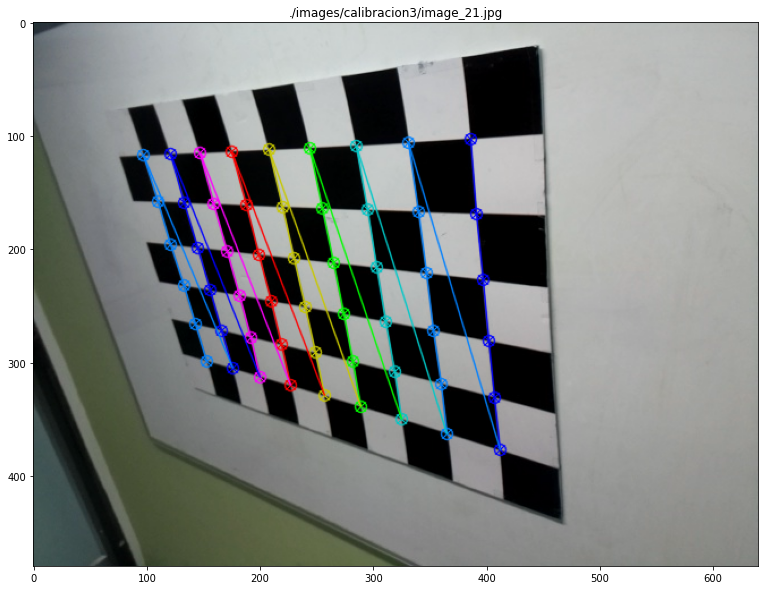

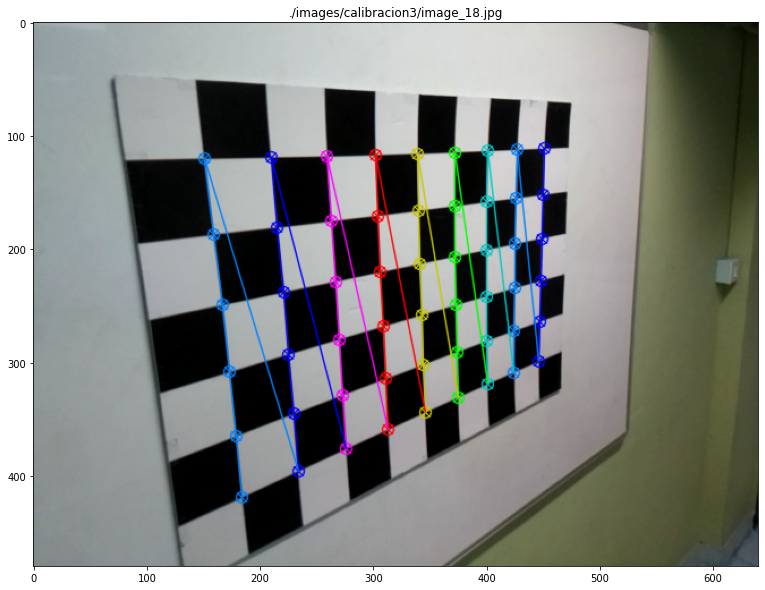

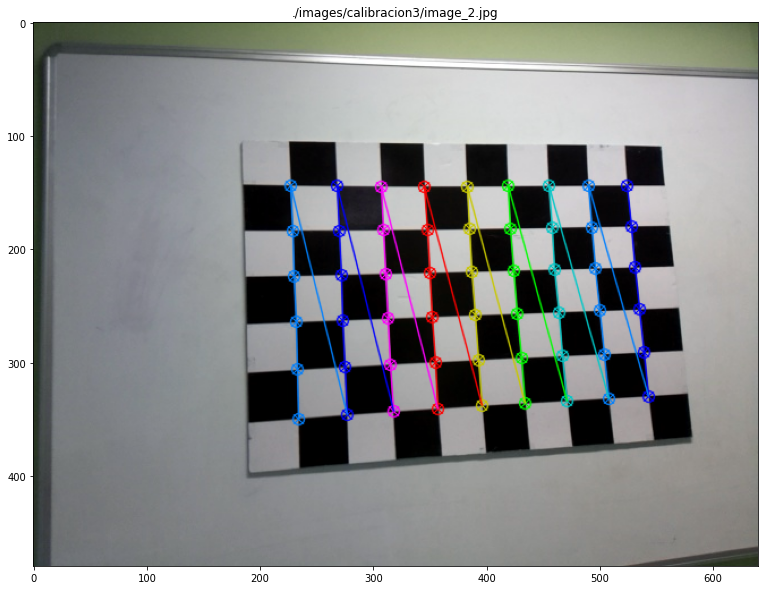

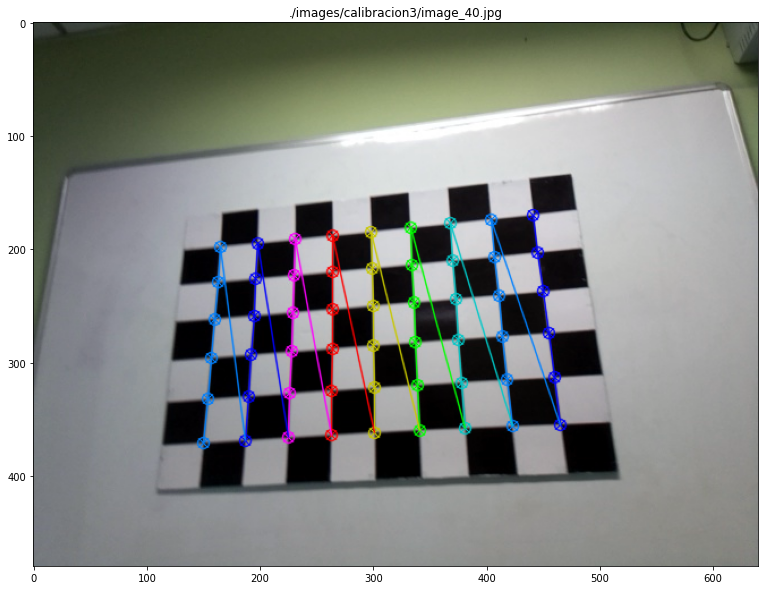

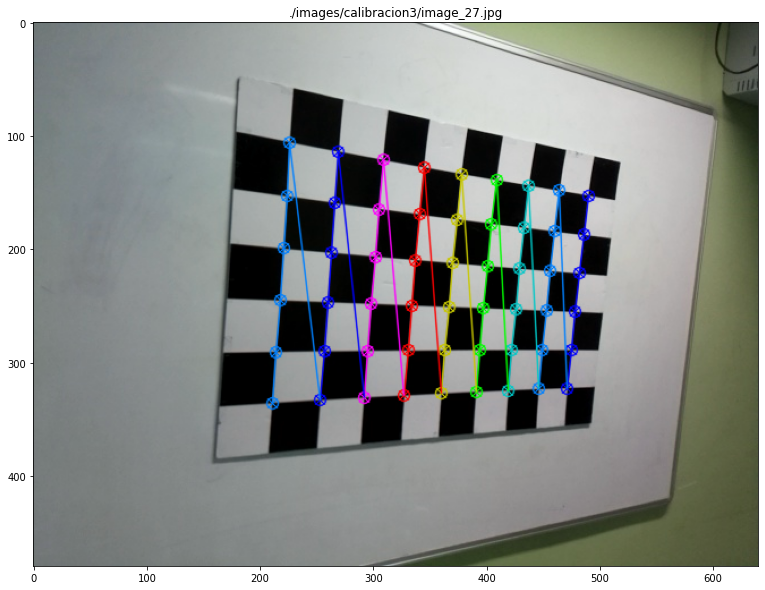

...

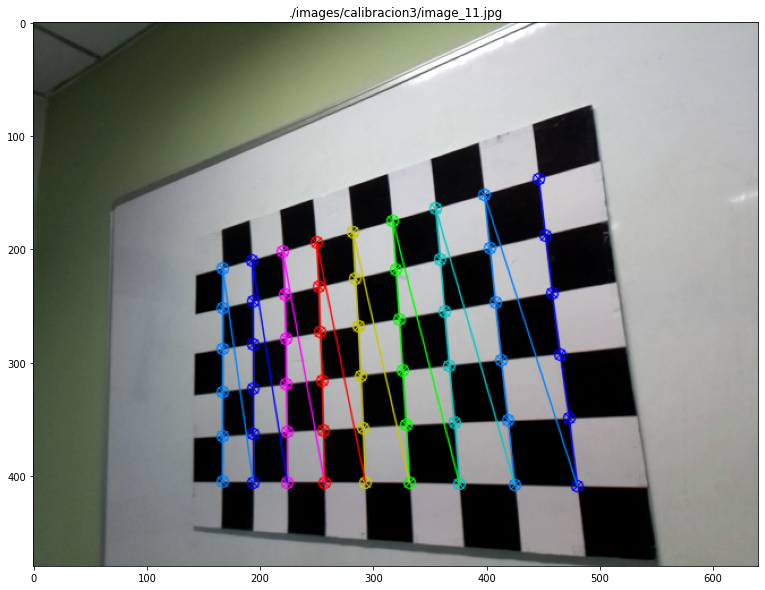

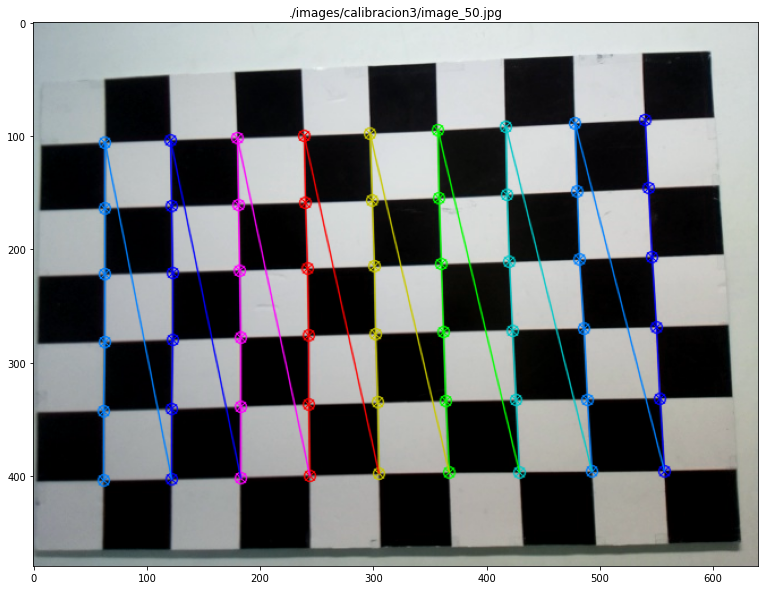

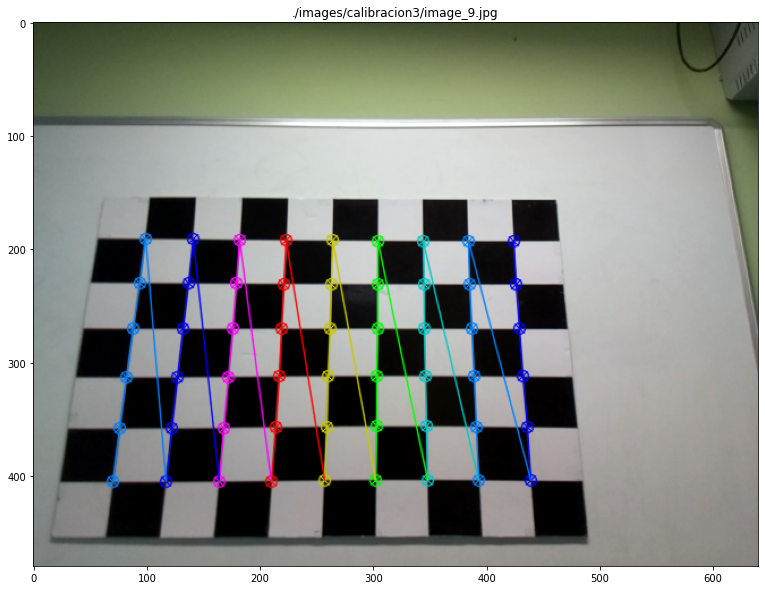

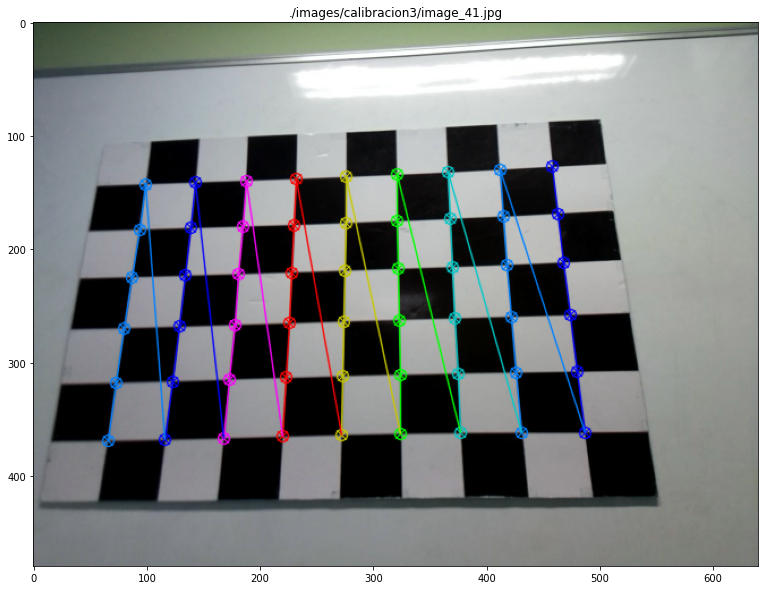

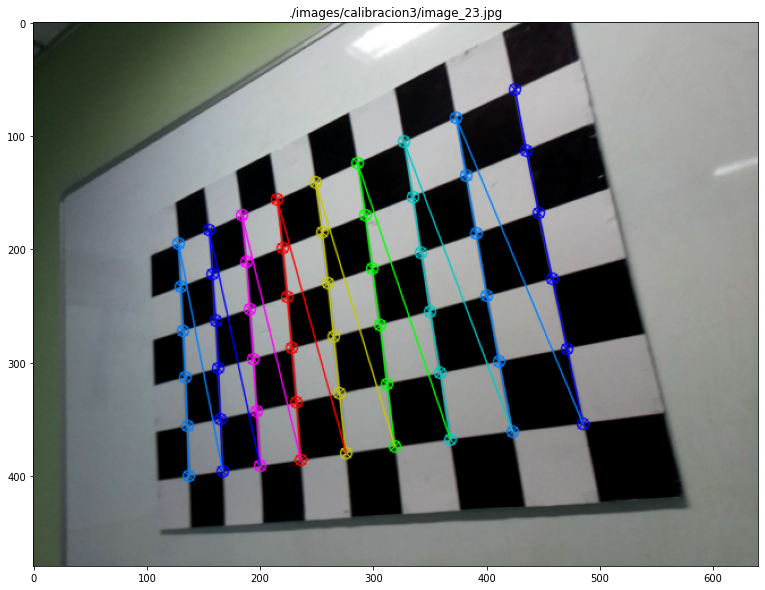

In [11]:
matplotlib.rcParams['figure.figsize'] = (14.0, 10.0)

# TAREFA 2b
images_path = './images/'
images = glob.glob(images_path + 'calibracion3/image*.jpg')
print("Numero de imaxes: ",len(images))

# Defina listas para almacenar tanto os puntos obxecto como os correspondentes puntos de imaxe
objpoints = []
imgpoints = []
criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 30, 0.001)
objp = np.zeros((1, 6 * 9, 3),np.float32)
objp[0,:,:2]=np.mgrid[0:6, 0:9].T.reshape(-1, 2)

# Busca cantos en cada patrón
for file in images:
    print("Procesando:", file, end=' ')
    img = cv2.imread(file)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    ret, corners = cv2.findChessboardCorners(gray, (6,9), None)
    
    # If atópanse esquinas, fai coincidir os puntos do obxecto coas esquinas da imaxe
    if ret == True:
        print("[OK]")
        
        objpoints.append(objp)
        corners = cv2.cornerSubPix(gray, corners, (11,11), (-1,-1), criteria)
        imgpoints.append(corners)
        
        # Visualiza a primeira imaxe coas esquinas detectadas
        cv2.drawChessboardCorners(img, (6,9), corners, ret)
        plt.figure()
        plt.title(file)
        plt.imshow(img)
        
    else:
        print("[NOK]")

print("Numero de patrons atopados:", len(objpoints))
print("Numero de puntos atopados:", imgpoints[0].shape[0])
print("Tamaño da imaxe:", gray.shape)

### **<span style="color:green"><b><i>TAREA 4: calibrar a cámara</i></b></span>**

Agora, usaremos as listas obtidas no exercicio anterior para o método [cv2.calibrateCamera()](https://docs.opencv.org/4.2.0/d9/d0c/group__calib3d.html#ga3207604e4b1a1758aa66acb6ed5aa65d), que **devolve os parámetros intrínsecos, extrínsecos e de distorsión** da cámara, así como os parámetros de rotación e translación para todas as vistas. Este método tamén toma como entrada o tamaño das imaxes (usado só para inicializar a matriz intrínseca da cámara).

In [12]:
# ASSIGNMENT 2c

# Aplica o método de Zang para calibrar a cámara
_, intrinsic, distortion, rotation, translation = cv2.calibrateCamera(objpoints, imgpoints,gray.shape[:2], None, None)

print("Parametros intrinsecos:")
print(intrinsic)

print("Parametros distorsion:")
print(distortion)

tot_error = 0
for i in range(len(objpoints)):
    imgpoints2, _ = cv2.projectPoints(objpoints[i], rotation[i], translation[i], intrinsic, distortion)
    error = cv2.norm(imgpoints[i],imgpoints2, cv2.NORM_L2)/len(imgpoints2)    
    tot_error += error

print ("Erro medio: ", tot_error/len(objpoints))

Parametros intrinsecos:
[[503.68477278   0.         313.67563674]
 [  0.         503.37989194 243.25575476]
 [  0.           0.           1.        ]]
Parametros distorsion:
[[ 2.08346324e-01 -4.68650266e-01  4.51079180e-04 -1.93373893e-03
   2.37592401e-01]]
Erro medio:  0.031087925289080755


### <font color="blue"><b><i>Reflexionando:</i></b></font>

**Agora estás nunha boa posición para responder a estas preguntas:**

- que **tipo de distorsión radial** ten a cámara empregada?

     <p style="margin: 4px 0px 6px 5px; color:blue"><i>Barrel posto que k1<0</i></p>
    
- Identifica os teus **parámetros intrínsecos da cámara** na matriz da cámara e o centro da imaxe é (313.67563673,243.25575477).

     <p style="margin: 4px 0px 6px 5px; color:blue"><i>Obtense  unha distancia focal de 503 e  </i></p>
    
- Que significa o "erro medio"?

     <p style="margin: 4px 0px 6px 5px; color:blue"><i>É unha estimacion dos errores sobre os parametros encontrados</i></p>

### **<span style="color:green"><b><i>TAREA 5: Imaxe sen distorsión</i></b></span>**

Por último, agora que temos a matriz da cámara e os parámetros de distorsión, imos utilizar [cv2.undistort()](https://docs.opencv.org/4.2.0/d9/d0c/group__calib3d.html#ga69f2545a8b62a6b0fc2ee060dc30559d) para eliminar a distorsión da imaxe. Este método toma a imaxe como entrada, así como a matriz da cámara e os parámetros de distorsión. Despois, **elimina as distorsións tanxenciais e radiais** da imaxe e devólvea.

**Mostrar a imaxe orixinal e a non distorsionada**.

*Ten en conta que se a distorsión é baixa, o cambio pode ser imperceptible.*

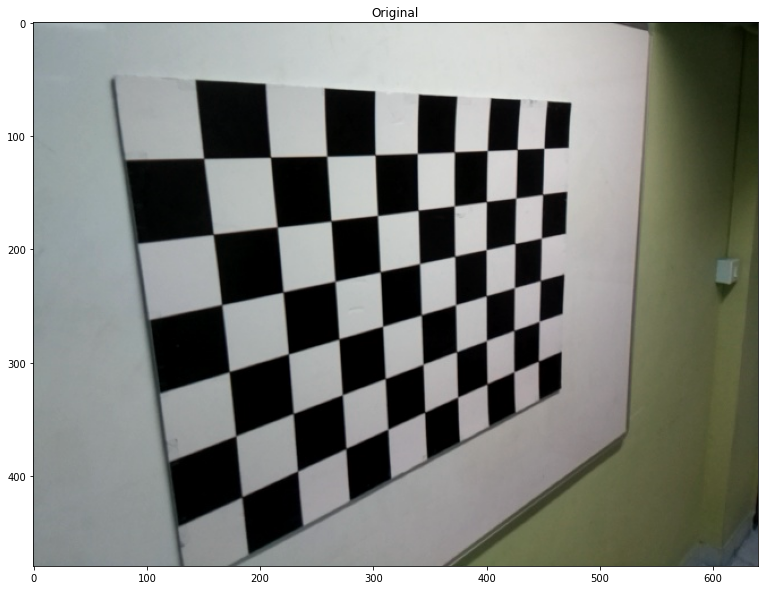

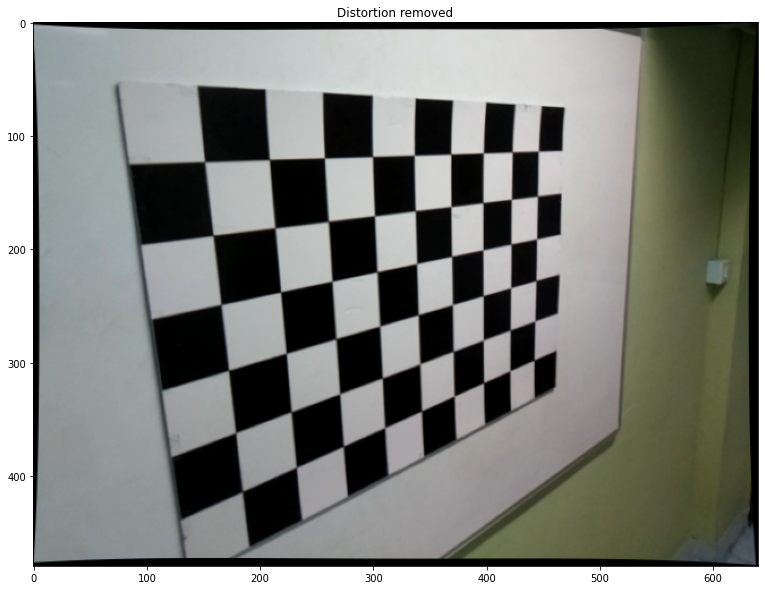

In [14]:
#Tarefa 5
# Lemos a imaxe
img = cv2.imread(images[1])
h, w = img.shape[:2]
newCameraMatrix, roi = cv2.getOptimalNewCameraMatrix(intrinsic, distortion, (w, h), 1, (w, h))

# Imaxe sen distorsion
dst = cv2.undistort(img, intrinsic, distortion, None,newCameraMatrix) # Leave the last None as it is!

# Visualizamos a orixinal e a sen distorsion
plt.figure()
plt.title("Original")
plt.imshow(img)

plt.figure()
plt.title("Distortion removed")
plt.imshow(dst);

## Conclusión

Gran traballo! É mellor gardar os valores intrínsecos da túa cámara porque os necesitarás para o próximo caderno.

Neste lección aprendeches:

- diferentes tipos de distorsións e como eliminalas,
- como calibrar calquera cámara, usando a implementación de OpenCV do método de Zhang,
- como funciona o método de calibración DLT.
